In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sentence_transformers import SentenceTransformer
from sklearn.metrics import silhouette_score
import sys
from pathlib import Path
sys.path.append(str(Path("..").resolve()))
from db.database import Database
from util.dataframe_utils import get_dataframes
from sklearn.metrics.pairwise import cosine_distances, cosine_similarity

In [2]:
db = Database()
bp_df, topics_df, posts_df = get_dataframes(db)
bp_df.head()

,blueprint_hash,id,name,extracted_keywords,blueprint_code,blueprint_url,post_id,description,keywords_yake,topic_id,tags,created_at
0,2f523787adf856fbddd08b2f7b32aa2490eb48a236bc68...,1,Nag prompt blueprint,"{""input__input_boolean"": 2}",blueprint:\n name: Nag prompt blueprint\n de...,https://community.home-assistant.io//t/nag-pro...,1220860,Nag a mobile device to do something,"[""android notification"", ""nag prompt"", ""nag no...",255041,[],2020-12-14 01:40:32.358
1,ca6a74b04fac9cee0925adfe7cb03c8beb0354a816fa66...,2,Inovelli,{},blueprint:\n name: Inovelli \n description: ...,https://community.home-assistant.io//t/inovell...,1220678,Use this blueprint to create automations based...,"[""fan"", ""inovelli"", ""create"", ""dimmer""]",254999,"[""blueprint""]",2020-12-13 22:32:38.158
2,c5f67655e23dff66b1042d3b38e967d74dad01a4a3d589...,3,deCONZ - IKEA five button remote,"{""input__deconz"": 1}",blueprint:\n name: deCONZ - IKEA five button ...,https://community.home-assistant.io//t/deconz-...,1223455,Control anything using IKEA five button remote\n,"[""button short"", ""button remote"", ""long press""...",255699,"[""switch"", ""blueprint"", ""deconz""]",2020-12-15 12:18:15.898
3,00b1c4d2e847ed9451c8e8d1acfbbcd5e1740f9991226d...,4,Heat for certain time,"{""input__input_datetime"": 1, ""input__climate"": 2}",blueprint:\n name: Heat for certain time\n d...,https://community.home-assistant.io//t/set-hea...,1223628,Turn on heating for a given amount of time.,"[""set heating"", ""heating temperature"", ""time"",...",255742,[],2020-12-15 14:23:53.414
4,0dd0ec70d42f2e8a428ae7a2934852dbec0beb34cd03cc...,5,Light Allowance,"{""input__light"": 1, ""output__light"": 1}",blueprint:\n name: Light Allowance\n descrip...,https://community.home-assistant.io//t/light-a...,1224871,Turns a light off after an allotted time,"[""light allowance"", ""light"", ""allowance"", ""all...",256045,[],2020-12-16 04:23:36.519


In [4]:
import json, re
def process_bp_keywords(kwd_dict: dict[str, int] | str) -> list[str] | None:
    if isinstance(kwd_dict, str):
        kwd_dict = json.loads(kwd_dict)
    
    kwd_list = list(kwd_dict.keys())
    if kwd_list.__len__() < 1:
        return None
    
    kwds = []
    
    for kwd in kwd_list:
        in_out = re.search(r"(input__|output__)(input_|output_)?", kwd)
        kwd = kwd.removeprefix(in_out.group()) if in_out else kwd
        in_out = in_out.group(1) if in_out else None
        kwds.append(in_out + kwd if in_out else kwd)
    return kwds

In [5]:
ignorable_tags = {"blueprint", "automation"}
bp_df["tags"] = bp_df["tags"].apply(lambda tags: [tag for tag in json.loads(tags) if tag not in ignorable_tags])
bp_df.head()

,blueprint_hash,id,name,extracted_keywords,blueprint_code,blueprint_url,post_id,description,keywords_yake,topic_id,tags,created_at
0,2f523787adf856fbddd08b2f7b32aa2490eb48a236bc68...,1,Nag prompt blueprint,"{""input__input_boolean"": 2}",blueprint:\n name: Nag prompt blueprint\n de...,https://community.home-assistant.io//t/nag-pro...,1220860,Nag a mobile device to do something,"[""android notification"", ""nag prompt"", ""nag no...",255041,[],2020-12-14 01:40:32.358
1,ca6a74b04fac9cee0925adfe7cb03c8beb0354a816fa66...,2,Inovelli,{},blueprint:\n name: Inovelli \n description: ...,https://community.home-assistant.io//t/inovell...,1220678,Use this blueprint to create automations based...,"[""fan"", ""inovelli"", ""create"", ""dimmer""]",254999,[],2020-12-13 22:32:38.158
2,c5f67655e23dff66b1042d3b38e967d74dad01a4a3d589...,3,deCONZ - IKEA five button remote,"{""input__deconz"": 1}",blueprint:\n name: deCONZ - IKEA five button ...,https://community.home-assistant.io//t/deconz-...,1223455,Control anything using IKEA five button remote\n,"[""button short"", ""button remote"", ""long press""...",255699,"[switch, deconz]",2020-12-15 12:18:15.898
3,00b1c4d2e847ed9451c8e8d1acfbbcd5e1740f9991226d...,4,Heat for certain time,"{""input__input_datetime"": 1, ""input__climate"": 2}",blueprint:\n name: Heat for certain time\n d...,https://community.home-assistant.io//t/set-hea...,1223628,Turn on heating for a given amount of time.,"[""set heating"", ""heating temperature"", ""time"",...",255742,[],2020-12-15 14:23:53.414
4,0dd0ec70d42f2e8a428ae7a2934852dbec0beb34cd03cc...,5,Light Allowance,"{""input__light"": 1, ""output__light"": 1}",blueprint:\n name: Light Allowance\n descrip...,https://community.home-assistant.io//t/light-a...,1224871,Turns a light off after an allotted time,"[""light allowance"", ""light"", ""allowance"", ""all...",256045,[],2020-12-16 04:23:36.519


In [6]:
max_keywords = bp_df["extracted_keywords"].apply(lambda x: len(json.loads(x)) if isinstance(x, str) else 0).max() 
max_tags = bp_df["tags"].apply(lambda x: len(x) if isinstance(x, list) else 0).max()
max_yake = 4
max_features = max_keywords + max_tags + max_yake
max_keywords, max_tags, max_features

(15, 5, 24)

In [7]:
def extract_features(row, max_features=max_features):
    padding = "<PAD>"
    
    yake_features = json.loads(row["keywords_yake"])
    combined_features = list(yake_features)
    ext_kw = process_bp_keywords(row["extracted_keywords"])
    if ext_kw:
        combined_features.extend(ext_kw)
    
    kw_n = max_keywords - len(ext_kw) if ext_kw else max_keywords
    combined_features += [padding] * kw_n
    
    tags = row["tags"]
    tag_n = max_tags - len(tags)
    combined_features.extend(tags)
    combined_features += [padding] * tag_n

    return combined_features

In [8]:
bp_df["features"] = bp_df.apply(extract_features, axis=1)
bp_df.head()

,blueprint_hash,id,name,extracted_keywords,blueprint_code,blueprint_url,post_id,description,keywords_yake,topic_id,tags,created_at,features
0,2f523787adf856fbddd08b2f7b32aa2490eb48a236bc68...,1,Nag prompt blueprint,"{""input__input_boolean"": 2}",blueprint:\n name: Nag prompt blueprint\n de...,https://community.home-assistant.io//t/nag-pro...,1220860,Nag a mobile device to do something,"[""android notification"", ""nag prompt"", ""nag no...",255041,[],2020-12-14 01:40:32.358,"[android notification, nag prompt, nag notific..."
1,ca6a74b04fac9cee0925adfe7cb03c8beb0354a816fa66...,2,Inovelli,{},blueprint:\n name: Inovelli \n description: ...,https://community.home-assistant.io//t/inovell...,1220678,Use this blueprint to create automations based...,"[""fan"", ""inovelli"", ""create"", ""dimmer""]",254999,[],2020-12-13 22:32:38.158,"[fan, inovelli, create, dimmer, <PAD>, <PAD>, ..."
2,c5f67655e23dff66b1042d3b38e967d74dad01a4a3d589...,3,deCONZ - IKEA five button remote,"{""input__deconz"": 1}",blueprint:\n name: deCONZ - IKEA five button ...,https://community.home-assistant.io//t/deconz-...,1223455,Control anything using IKEA five button remote\n,"[""button short"", ""button remote"", ""long press""...",255699,"[switch, deconz]",2020-12-15 12:18:15.898,"[button short, button remote, long press, butt..."
3,00b1c4d2e847ed9451c8e8d1acfbbcd5e1740f9991226d...,4,Heat for certain time,"{""input__input_datetime"": 1, ""input__climate"": 2}",blueprint:\n name: Heat for certain time\n d...,https://community.home-assistant.io//t/set-hea...,1223628,Turn on heating for a given amount of time.,"[""set heating"", ""heating temperature"", ""time"",...",255742,[],2020-12-15 14:23:53.414,"[set heating, heating temperature, time, set, ..."
4,0dd0ec70d42f2e8a428ae7a2934852dbec0beb34cd03cc...,5,Light Allowance,"{""input__light"": 1, ""output__light"": 1}",blueprint:\n name: Light Allowance\n descrip...,https://community.home-assistant.io//t/light-a...,1224871,Turns a light off after an allotted time,"[""light allowance"", ""light"", ""allowance"", ""all...",256045,[],2020-12-16 04:23:36.519,"[light allowance, light, allowance, allotted, ..."


In [9]:
model = SentenceTransformer('all-MiniLM-L6-v2')

# Apply the updated function
bp_df["features"] = bp_df.apply(lambda row: extract_features(row, max_features=max_features), axis=1)

bp_df["features"] = bp_df["features"].apply(lambda x: " ".join(x))  # Combine list of strings into a single string
bp_df["embeddings"] = bp_df["features"].apply(lambda x: model.encode(x))

# Create a feature matrix
X = np.vstack(bp_df["embeddings"].values)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [10]:
from sklearn.preprocessing import normalize
model = SentenceTransformer('all-MiniLM-L6-v2')

# Apply the updated function
bp_df["features"] = bp_df.apply(lambda row: extract_features(row, max_features=15), axis=1)

bp_df["features"] = bp_df["features"].apply(lambda x: " ".join(x))  # Combine list of strings into a single string
bp_df["embeddings"] = bp_df["features"].apply(lambda x: model.encode(x))

# Create a feature matrix
X = np.vstack(bp_df["embeddings"].values)
X_normalized = normalize(X, norm='l2')

Silhouette score for k=2: 0.0652
Silhouette score for k=3: 0.0609
Silhouette score for k=4: 0.0541
Silhouette score for k=5: 0.0633
Silhouette score for k=6: 0.0639
Silhouette score for k=7: 0.0676
Silhouette score for k=8: 0.0647
Silhouette score for k=9: 0.0700
Silhouette score for k=10: 0.0535
Silhouette score for k=11: 0.0557
Silhouette score for k=12: 0.0616
Silhouette score for k=13: 0.0550
Silhouette score for k=14: 0.0563
Silhouette score for k=15: 0.0623
Silhouette score for k=16: 0.0679
Silhouette score for k=17: 0.0673
Silhouette score for k=18: 0.0680
Silhouette score for k=19: 0.0690
Silhouette score for k=20: 0.0691
Silhouette score for k=21: 0.0660
Silhouette score for k=22: 0.0659
Silhouette score for k=23: 0.0600
Silhouette score for k=24: 0.0607
Silhouette score for k=25: 0.0589
Silhouette score for k=26: 0.0604
Silhouette score for k=27: 0.0544
Silhouette score for k=28: 0.0603
Silhouette score for k=29: 0.0638
Silhouette score for k=30: 0.0650
Silhouette score for k

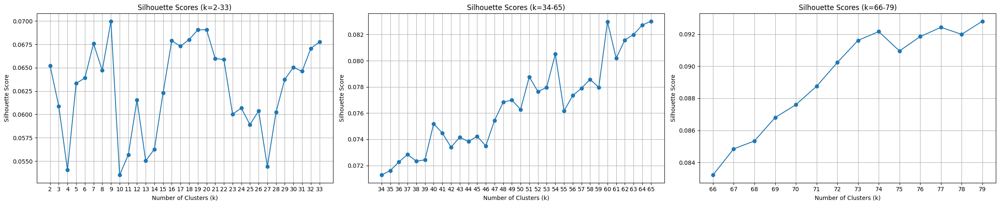

In [11]:
def plot_silhouette_scores(X, k_range):
    scores = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        score = silhouette_score(X, labels)
        scores.append(score)
        print(f"Silhouette score for k={k}: {score:.4f}")
        
    max_scores = 32
    num_plots = (len(k_range) + max_scores - 1) // max_scores

    fig, axes = plt.subplots(1, num_plots, figsize=(8 * num_plots, 5))
    if num_plots == 1:
        axes = [axes]

    for plot_idx in range(num_plots):
        start_idx = plot_idx * max_scores
        end_idx = min(start_idx + max_scores, len(k_range))
        
        k_subset = list(k_range)[start_idx:end_idx]
        score_subset = scores[start_idx:end_idx]

        axes[plot_idx].plot(k_subset, score_subset, marker='o')
        axes[plot_idx].set_title(f"Silhouette Scores (k={k_subset[0]}-{k_subset[-1]})")
        axes[plot_idx].set_xlabel("Number of Clusters (k)")
        axes[plot_idx].set_ylabel("Silhouette Score")
        axes[plot_idx].set_xticks(k_subset)
        axes[plot_idx].grid()
    plt.tight_layout()
    plt.show()
#plot_silhouette_scores(X_scaled, range(2, 80))
plot_silhouette_scores(X_normalized, range(2, 80))

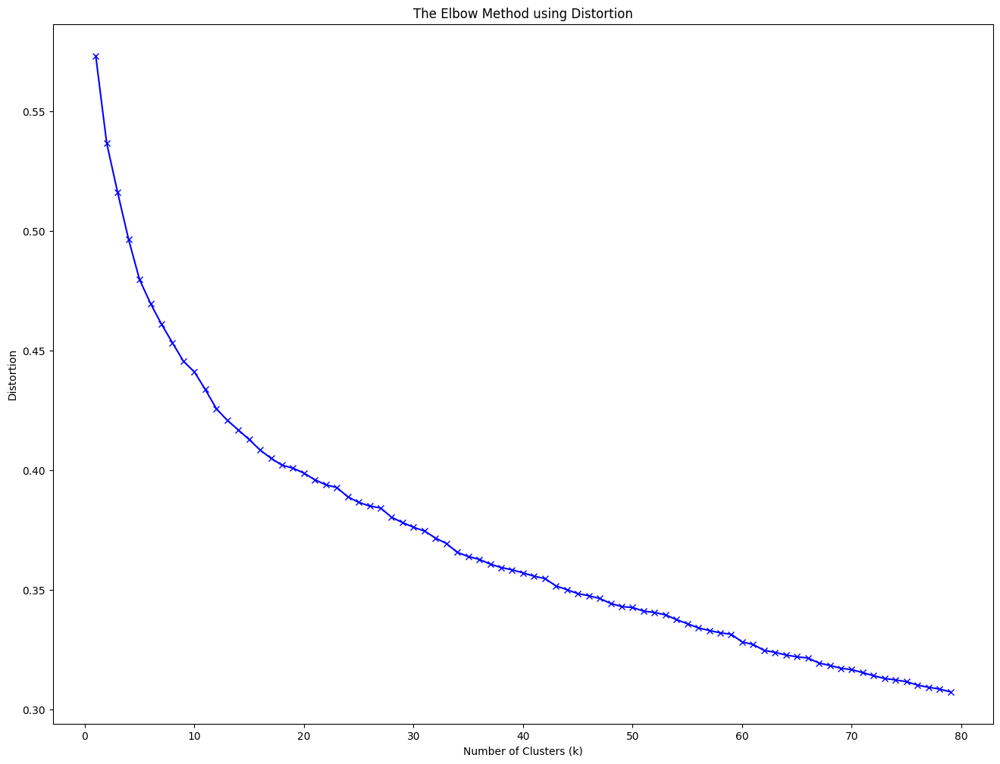

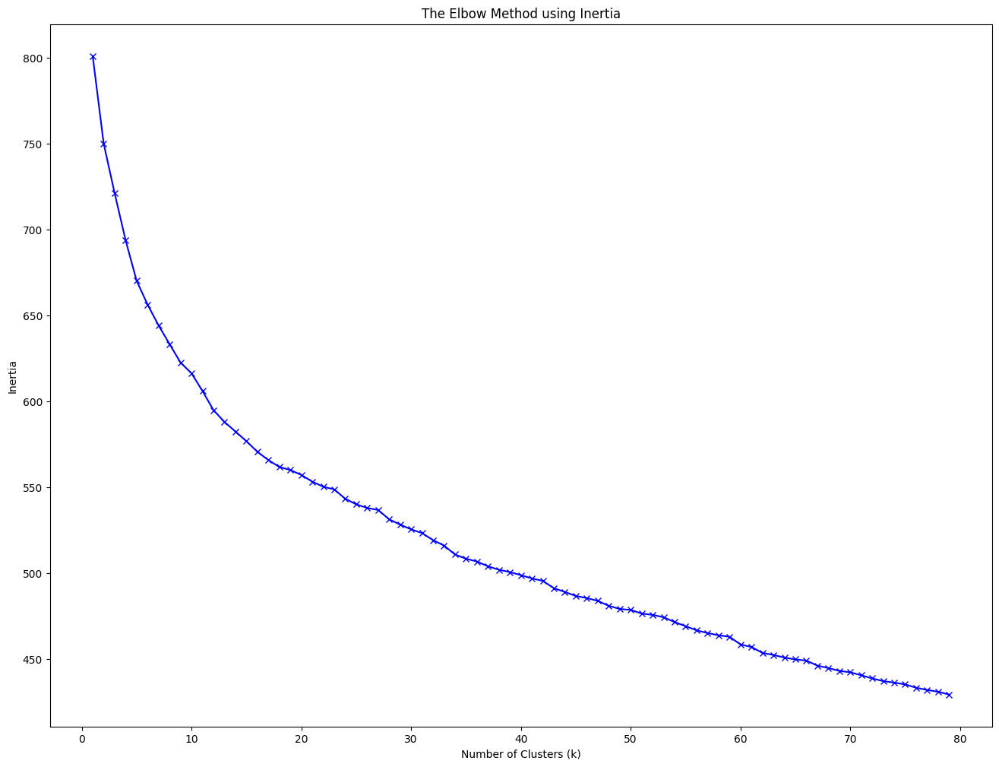

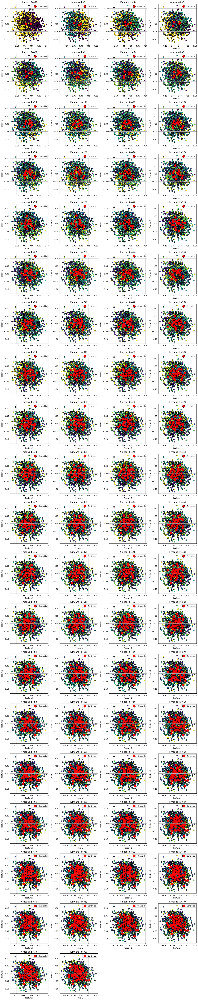

In [12]:
from scipy.spatial.distance import cdist
def plot_elbow(X, k_range):
    distortions = []
    inertias = []
    mapping1 = {}
    mapping2 = {}
    K = range(1, k_range.stop)
    for k in K:
        kmeanModel = KMeans(n_clusters=k, random_state=42)
        kmeanModel.fit(X)
        distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)**2) / X.shape[0])
        inertias.append(kmeanModel.inertia_)
        mapping1[k] = distortions[-1]
        mapping2[k] = inertias[-1]

    plt.figure(figsize=(16, 12))
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method using Distortion')
    plt.show()
    plt.close()
    
    plt.figure(figsize=(16, 12))
    plt.plot(K, inertias, 'bx-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')
    plt.title('The Elbow Method using Inertia')
    plt.show()
    plt.close()
    
    n_plots = len(k_range)
    n_cols = 4
    n_rows = (n_plots + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
    axes = axes.flatten()
    
    for idx, k in enumerate(k_range):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        y_kmeans = kmeans.fit_predict(X)

        axes[idx].scatter(X[:, 0], X[:, 1], c=y_kmeans, cmap='viridis', marker='o', edgecolor='k', s=50)
        axes[idx].scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                    s=200, c='red', label='Centroids', edgecolor='k')
        axes[idx].set_title(f'K-means (k={k})')
        axes[idx].set_xlabel('Feature 1')
        axes[idx].set_ylabel('Feature 2')
        axes[idx].legend()
        axes[idx].grid()
    
    for idx in range(n_plots, len(axes)):
        axes[idx].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    plt.close()
#plot_elbow(X_scaled, range(2, 80))
plot_elbow(X_normalized, range(2, 80))

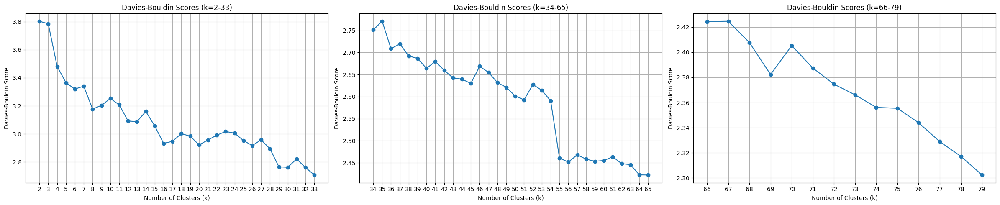

In [13]:
from sklearn.metrics import davies_bouldin_score
def davies_bouldin_scores(X, k_range):
    scores = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        score = davies_bouldin_score(X, labels)
        scores.append(score)
    
        
    max_scores = 32
    num_plots = (len(k_range) + max_scores - 1) // max_scores

    fig, axes = plt.subplots(1, num_plots, figsize=(8 * num_plots, 5))
    if num_plots == 1:
        axes = [axes]

    for plot_idx in range(num_plots):
        start_idx = plot_idx * max_scores
        end_idx = min(start_idx + max_scores, len(k_range))
        
        k_subset = list(k_range)[start_idx:end_idx]
        score_subset = scores[start_idx:end_idx]

        axes[plot_idx].plot(k_subset, score_subset, marker='o')
        axes[plot_idx].set_title(f"Davies-Bouldin Scores (k={k_subset[0]}-{k_subset[-1]})")
        axes[plot_idx].set_xlabel("Number of Clusters (k)")
        axes[plot_idx].set_ylabel("Davies-Bouldin Score")
        axes[plot_idx].set_xticks(k_subset)
        axes[plot_idx].grid()
    plt.tight_layout()
    plt.show()
#davies_bouldin_scores(X_scaled, range(2, 80))
davies_bouldin_scores(X_normalized, range(2, 80))

In [14]:
kmeans = KMeans(n_clusters=55, random_state=42)
#labels = kmeans.fit_predict(X_scaled)
labels = kmeans.fit_predict(X_normalized)

centroids = kmeans.cluster_centers_

similarity_matrix = cosine_similarity(centroids)
threshold = 0.50
pairs = []
for i in range(similarity_matrix.shape[0]):
    for j in range(i + 1, similarity_matrix.shape[1]):
        sim = similarity_matrix[i, j]
        if sim >= threshold:
            pairs.append((i, j, sim))
            
pairs = sorted(pairs, key=lambda x: x[2], reverse=True)
for i, j, sim in pairs:
    print(f"Cluster {i} ↔ Cluster {j}: cosine similarity = {sim:.3f}")

Cluster 7 ↔ Cluster 44: cosine similarity = 0.930
Cluster 1 ↔ Cluster 7: cosine similarity = 0.906
Cluster 13 ↔ Cluster 34: cosine similarity = 0.905
Cluster 36 ↔ Cluster 44: cosine similarity = 0.896
Cluster 1 ↔ Cluster 44: cosine similarity = 0.891
Cluster 17 ↔ Cluster 19: cosine similarity = 0.889
Cluster 22 ↔ Cluster 46: cosine similarity = 0.886
Cluster 19 ↔ Cluster 37: cosine similarity = 0.886
Cluster 10 ↔ Cluster 31: cosine similarity = 0.886
Cluster 7 ↔ Cluster 36: cosine similarity = 0.885
Cluster 1 ↔ Cluster 46: cosine similarity = 0.884
Cluster 21 ↔ Cluster 46: cosine similarity = 0.883
Cluster 1 ↔ Cluster 21: cosine similarity = 0.883
Cluster 21 ↔ Cluster 44: cosine similarity = 0.880
Cluster 3 ↔ Cluster 5: cosine similarity = 0.877
Cluster 3 ↔ Cluster 15: cosine similarity = 0.872
Cluster 31 ↔ Cluster 38: cosine similarity = 0.872
Cluster 28 ↔ Cluster 40: cosine similarity = 0.867
Cluster 7 ↔ Cluster 21: cosine similarity = 0.867
Cluster 12 ↔ Cluster 21: cosine similarity

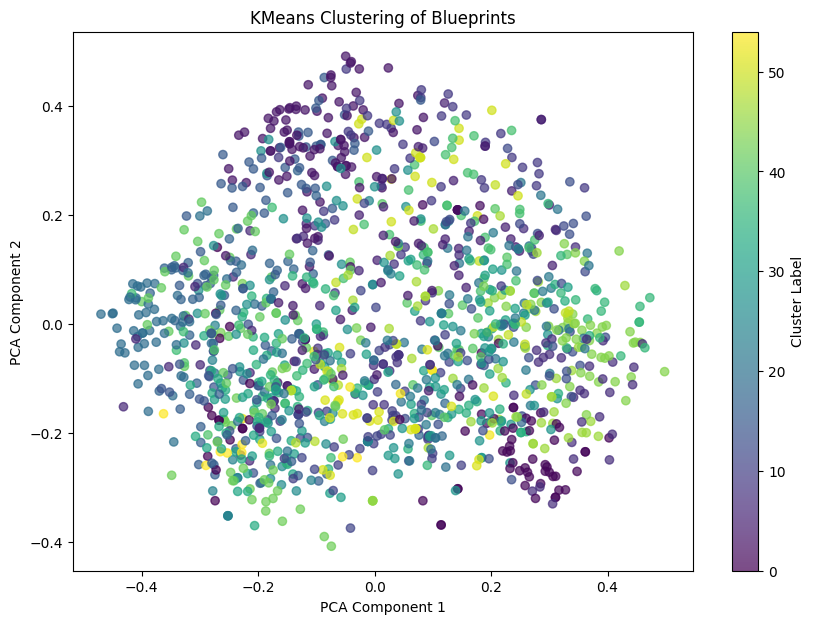

In [15]:
kmeans = KMeans(n_clusters=55, random_state=42)
#bp_df["cluster"] = kmeans.fit_predict(X_scaled)
bp_df["cluster"] = kmeans.fit_predict(X_normalized)

def visualize_clusters(X, labels):
    import matplotlib.pyplot as plt
    from sklearn.decomposition import PCA

    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)

    plt.figure(figsize=(10, 7))
    scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=labels, cmap="viridis", alpha=0.7)
    plt.title("KMeans Clustering of Blueprints")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.colorbar(scatter, label="Cluster Label")
    plt.show()


#visualize_clusters(X_scaled, bp_df["cluster"]) 
visualize_clusters(X_normalized, bp_df["cluster"]) 

In [16]:
def representative_blueprints(cluster_id, n=5):
    cluster_mask = bp_df["cluster"] == cluster_id
    #cluster_points = X_scaled[cluster_mask]
    cluster_points = X_normalized[cluster_mask]

    centroid = centroids[cluster_id].reshape(1, -1)
    distances = cosine_distances(cluster_points, centroid).flatten()

    idx = np.argsort(distances)[:n]
    return bp_df[cluster_mask].iloc[idx]

for pair in pairs:
    c1, c2, sim = pair
    print(f"\nSimilar Clusters {c1} and {c2} (cosine similarity: {sim:.3f})")
    print(f"Top 3 blueprints from Cluster {c1}:")
    rep_bps_c1 = representative_blueprints(c1, n=3)
    for _, row in rep_bps_c1.iterrows():
        print(f"- ID: {row['id']}, Title: {row['name']}")
    
    print(f"Top 3 blueprints from Cluster {c2}:")
    rep_bps_c2 = representative_blueprints(c2, n=3)
    for _, row in rep_bps_c2.iterrows():
        print(f"- ID: {row['id']}, Title: {row['name']}")


Similar Clusters 7 and 44 (cosine similarity: 0.930)
Top 3 blueprints from Cluster 7:
- ID: 1415, Title: Zigbee2MQTT - Mijia Wireless Remote Switch (WXKG01LM) actions
- ID: 2025, Title: Z2M v2.0 - Inovelli 2-in-1 switch + dimmer Scene Controls
- ID: 1377, Title: Zigbee2MQTT - OSRAM Smart+ switch mini (AC0251100NJ/AC0251600NJ/AC0251700NJ) actions
Top 3 blueprints from Cluster 44:
- ID: 519, Title: Zigbee2MQTT - Yifan 4 button switch
- ID: 1607, Title: Aqara Wireless Mini Switch (WXKG11LM)
- ID: 163, Title: ZigBee2Mqtt - Xiaomi WXKG12LM Wireless Switch

Similar Clusters 1 and 7 (cosine similarity: 0.906)
Top 3 blueprints from Cluster 1:
- ID: 515, Title: Zigbee2MQTT - Tuya 4-Button Scene Switch TS004F
- ID: 366, Title: ZHA Schneider Wiser 4-Button
- ID: 1505, Title: ZHA - iCasa Black Remote ICZB-RM11S v2
Top 3 blueprints from Cluster 7:
- ID: 1415, Title: Zigbee2MQTT - Mijia Wireless Remote Switch (WXKG01LM) actions
- ID: 2025, Title: Z2M v2.0 - Inovelli 2-in-1 switch + dimmer Scene Con

In [17]:
from collections import Counter

def analyze_cluster_features(bp_df, cluster_id, top_n=10):
    """Analyze the most common features in a specific cluster"""
    cluster_data = bp_df[bp_df["cluster"] == cluster_id]
    
    all_features = []
    for features in cluster_data["features"]:
        feature_list = [f for f in features.split() if f != "<PAD>"]
        all_features.extend(feature_list)
    
    feature_counts = Counter(all_features)
    
    """ print(f"\nTop {top_n} features in Cluster {cluster_id}:")
    for feature, count in feature_counts.most_common(top_n):
        print(f"  {feature}: {count}") """
    
    return feature_counts.most_common(top_n)

for cluster_id in range(kmeans.n_clusters):
    analyze_cluster_features(bp_df, cluster_id, top_n=5)

In [18]:
from collections import Counter, defaultdict

cluster_features = defaultdict(list)
for idx, row in bp_df.iterrows():
    cluster_id = row["cluster"]
    feature_list = [f for f in row["features"].split() if f != "<PAD>"]
    cluster_features[cluster_id].extend(feature_list)

# Calculate feature frequencies per cluster
cluster_feature_counts = {}
for cluster_id, features in cluster_features.items():
    cluster_feature_counts[cluster_id] = Counter(features)

# Find features that are distinctive (appear heavily in some clusters but not others)
all_features = set()
for counts in cluster_feature_counts.values():
    all_features.update(counts.keys())

# Calculate variance in feature distribution across clusters
feature_variance = {}
for feature in all_features:
    counts = [cluster_feature_counts[c].get(feature, 0) for c in range(kmeans.n_clusters)]
    feature_variance[feature] = np.var(counts)

# Sort by variance (higher variance = more distinctive)
sorted_features = sorted(feature_variance.items(), key=lambda x: x[1], reverse=True)

print("\nTop 20 most distinctive features across clusters:")
for feature, variance in sorted_features[:20]:
    print(f"  {feature}: variance={variance:.2f}")
    cluster_presence = [(c, cluster_feature_counts[c].get(feature, 0)) 
                       for c in range(kmeans.n_clusters) 
                       if cluster_feature_counts[c].get(feature, 0) > 0]
    cluster_presence.sort(key=lambda x: x[1], reverse=True)
    print(f"    Most common in clusters: {cluster_presence[:3]}")


Top 20 most distinctive features across clusters:
  switch: variance=235.72
    Most common in clusters: [(44, 81), (7, 48), (38, 48)]
  lights: variance=163.77
    Most common in clusters: [(3, 91), (9, 22), (15, 19)]
  light: variance=140.86
    Most common in clusters: [(3, 81), (5, 25), (15, 24)]
  temperature: variance=101.07
    Most common in clusters: [(19, 72), (37, 20), (17, 13)]
  input__binary_sensor: variance=97.41
    Most common in clusters: [(15, 58), (3, 41), (17, 18)]
  button: variance=93.24
    Most common in clusters: [(1, 48), (31, 31), (5, 30)]
  zigbee: variance=85.45
    Most common in clusters: [(1, 44), (44, 40), (46, 31)]
  remote: variance=83.31
    Most common in clusters: [(46, 50), (22, 45), (8, 15)]
  press: variance=76.29
    Most common in clusters: [(1, 53), (10, 35), (21, 14)]
  output__light: variance=56.38
    Most common in clusters: [(3, 48), (15, 18), (21, 17)]
  sensor: variance=55.13
    Most common in clusters: [(41, 38), (15, 37), (3, 14)]

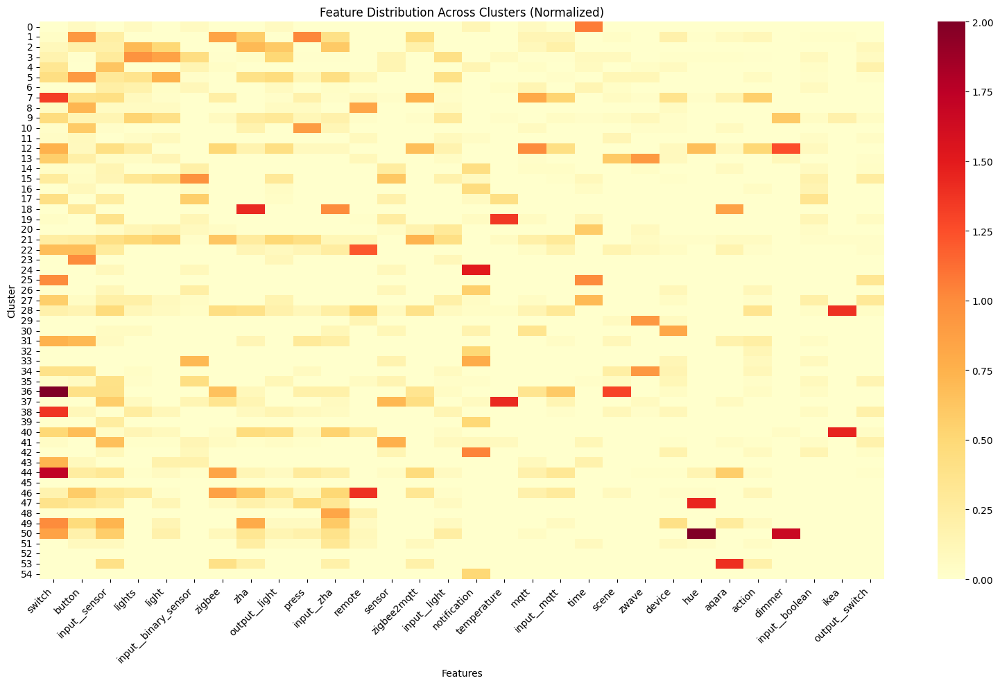

In [19]:
import seaborn as sns

# Get top features overall
all_feature_counts = Counter()
for features in bp_df["features"]:
    feature_list = [f for f in features.split() if f != "<PAD>"]
    all_feature_counts.update(feature_list)

top_features = [f for f, _ in all_feature_counts.most_common(30)]

# Create matrix: clusters x features
matrix = np.zeros((kmeans.n_clusters, len(top_features)))
for cluster_id in range(kmeans.n_clusters):
    cluster_counts = cluster_feature_counts[cluster_id]
    for i, feature in enumerate(top_features):
        matrix[cluster_id, i] = cluster_counts.get(feature, 0)

# Normalize by cluster size
cluster_sizes = bp_df["cluster"].value_counts().sort_index()
matrix = matrix / cluster_sizes.values[:, np.newaxis]

# Plot heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(matrix, xticklabels=top_features, yticklabels=range(kmeans.n_clusters), 
            cmap='YlOrRd', annot=False)
plt.title("Feature Distribution Across Clusters (Normalized)")
plt.xlabel("Features")
plt.ylabel("Cluster")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [20]:
def write_to_md(filename: str):    
    with open(filename, "w", encoding="utf-8") as f:
        for cluster_id in range(kmeans.n_clusters):
            f.write(f"<details>\n")
            features = analyze_cluster_features(bp_df, cluster_id, top_n=5)
            f.write(f"<summary> Cluster {cluster_id} </summary>\n\n")
            f.write(f"Top 5 features: \n")
            for feature, count in features:
                f.write(f"- {feature}: {count} \n")
            f.write("\n")
            bps = bp_df[bp_df["cluster"] == cluster_id]
            for idx, bp in bps.iterrows():
                post_url = topics_df[topics_df["post_id"] == bp["post_id"]]["post_url"].values[0]
                f.write(f"{bp['name']}, {post_url} \n\n")
            f.write(f"</details>\n\n")
c_name = "clusters_norm_55_updated"
write_to_md(f"output/{c_name}.md")

In [21]:
bp_df.to_pickle(f"output/bp_{c_name}.pkl")

In [33]:
import torch
torch.cuda.get_device_name(0)

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx